<h1 align="center">The Fourier Transform.</h1>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [172]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
from scipy import signal
import numpy as np
import IPython
from scipy import fftpack
import math
import imageio

In [173]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect.

In [174]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    def plot(self, dft = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        
        #plot regardless of input
        ax1 = plt.subplot(211)
        domain = np.linspace(0, len(self.samples)/self.rate, len(self.samples))
        
        ax1.plot(domain, self.samples)
        #ax1.set_ylim(-32768, 32767)
        plt.xlabel("Seconds")
        plt.ylabel("Magnitude")
        if not dft:
            plt.show()
            
        #Only plot if dft is True
        if dft:
            #calculate
            c_k = abs(fftpack.fft(self.samples))
            n = len(c_k)
            k_indices = np.arange(n)
            frequency = k_indices * self.rate/n
            #plot
            ax2 = plt.subplot(212)
            ax2.plot(frequency, c_k)
            ax2.set_xlim((0,2000))
            plt.show()
        
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        if force or self.samples.dtype != np.int16:
            #Scaling
            scaled_samples = np.int16((self.samples * 32767.0)/max(abs(self.samples)))
            wavfile.write(filename, self.rate, scaled_samples)
        else:
            wavfile.write(filename, self.rate, self.samples)
    
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):
            raise ValueError("sample lengths not the same size")
        else:
            #add matricies elementwise
            new_samples = self.samples + other.samples
            return SoundWave(self.rate, new_samples)

    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("rates are not equal")
        else:
            #concatenate matricies
            new_samples = np.concatenate((self.samples,other.samples))
            return SoundWave(self.rate, new_samples)

    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Rates not equal")
        else:
            if len(self.samples) < len(other.samples):
                self.samples = np.pad(self.samples,(0,len(other.samples) - len(self.samples)),'constant')
            elif len(self.samples) > len(other.samples):
                other.samples = np.pad(other.samples,(0,len(self.samples) - len(other.samples)),'constant')
            #convolve arrays
            convolution = fftpack.ifft(fftpack.fft(self.samples) * fftpack.fft(other.samples))
            return SoundWave(self.rate, convolution)

    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise ValueError("Rates not equal")
        else:
            n = len(self.samples)
            m = len(other.samples)
            length = n + m - 1
            a = np.log2(length)
            a = math.ceil(a)
            
            self_sam = np.pad(self.samples,(0,2**a - n),'constant')
            other_sam = np.pad(other.samples,(0,2**a - m),'constant')
            
            #convolve arrays
            convolution = fftpack.ifft(fftpack.fft(self_sam) * fftpack.fft(other_sam))
            #take first n+m-1 elements
            convolution = convolution[:length]
            
            return SoundWave(self.rate, convolution)

    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        n = len(self.samples)
        k_low = math.floor(low_freq * n / self.rate)
        k_high = math.ceil(high_freq * n / self.rate)
        
        dft = fftpack.fft(self.samples)
        dft[k_low:k_high] = 0 
        dft[n - k_high: n - k_low] = 0
        
        self.samples = fftpack.ifft(dft).real
        
        
        

### Visualize Tada.wav

- We use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

22050 (42752,)


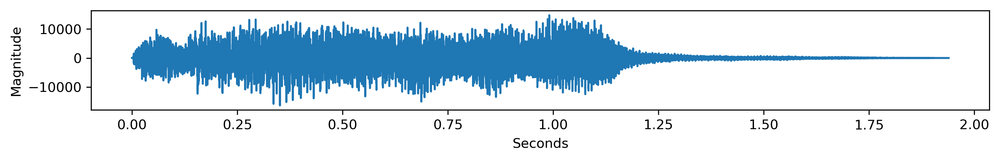

In [175]:
rate, samples = wavfile.read("tada.wav") #pull info from file
print(rate,samples.shape)
Tadaobj = SoundWave(rate,samples)
Tadaobj.plot()

### Testing our Export function

- We use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (using `force=True`).

In [176]:
IPython.display.Audio(filename = 'tada.wav') #read file for comparison

In [177]:
rate, samples = wavfile.read("tada.wav")
tada_ = SoundWave(rate,samples)
tada_.export('tada_not_scaled.wav') #export file, should be same as previous
IPython.display.Audio(filename = 'tada_not_scaled.wav')


In [178]:
tada_.export('tada_scaled.wav', True) #export scaled file, should be louder than previous
IPython.display.Audio(filename = 'tada_scaled.wav')

### We experiement with generate_note()
- We first use `generate_note()` to create an A tone that lasts for two seconds.

In [179]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    Rate = 44100 #code from textbook
    num_samples = duration * Rate
    domain = np.linspace(0,duration, num_samples)
    samples = np.sin(2*np.pi*domain*frequency)
    return SoundWave(Rate, samples)
    

In [180]:
a = generate_note(440, 2) #A note

IPython.display.Audio(rate=a.rate, data=a.samples)


### Elementwise addition and concatination

- We generate a three-second A minor chord (A, C, and E) and the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

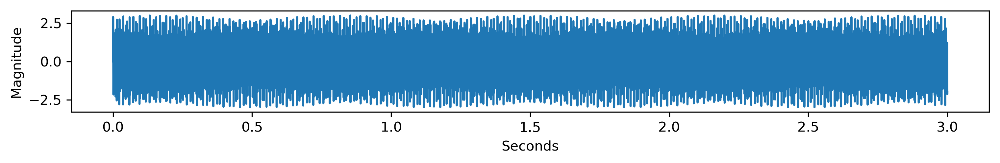

In [181]:
a = generate_note(440, 3)
c = generate_note(523.25, 3)
e = generate_note(659.25,3)
cord = a+c+e #notes added elementwise
cord.plot()
IPython.display.Audio(rate=cord.rate, data=cord.samples)

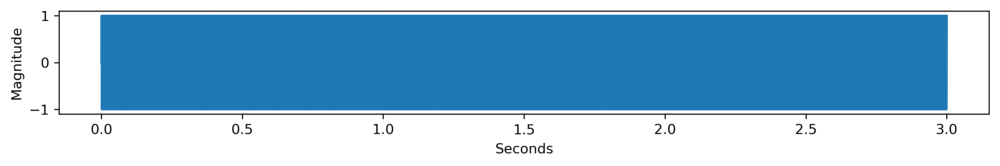

In [182]:
a = generate_note(440, 1)
c = generate_note(523.25, 1)
e = generate_note(659.25,1)
arpeggio = a>>c>>e #notes concatenated
arpeggio.plot()
IPython.display.Audio(rate=arpeggio.rate, data=arpeggio.samples)

### Discrete Fourier Transform

- We implement `simple_dft()` with the formula for $c_k$ given below, and we check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [183]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples) #code from textbook
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j*np.pi/n)*m@m.T)
    return W@samples/n
            

In [184]:

n = 8192 #power of 2
samples = np.random.random(n)
simple = simple_dft(samples)
sci = fftpack.fft(samples)
#compare textbook dft with scipy dft
np.allclose(n*simple,sci)


True

### Discrete Fast Fourier Transform
- We generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.

In [185]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #code from textbook
    n = len(samples) 
    if n <= threshold:
        return simple_dft(samples)
    else:
        even = simple_fft(samples[::2])
        odd = simple_fft(samples[1::2])
        w = np.exp(-2j*np.pi/n * np.arange(n))
        m = n//2
        first_sum = even + w[:m] * odd
        second_sum = even + w[m:] * odd
        return 0.5 *np.concatenate([first_sum, second_sum])
        

In [186]:

n = 8192 #power of 2
samples = np.random.random(n)
#time computation times
%time n*simple_dft(samples)
%time n*simple_fft(samples)
%time fftpack.fft(samples)


CPU times: user 6.9 s, sys: 598 ms, total: 7.5 s
Wall time: 5.89 s
CPU times: user 529 ms, sys: 0 ns, total: 529 ms
Wall time: 190 ms
CPU times: user 259 µs, sys: 0 ns, total: 259 µs
Wall time: 242 µs


array([4112.76818533 +0.j        ,   36.81596992 -0.17652356j,
         36.29521019-18.97214302j, ...,  -31.71769164 -0.1296043j ,
         36.29521019+18.97214302j,   36.81596992 +0.17652356j])

### Demonstration of DFT

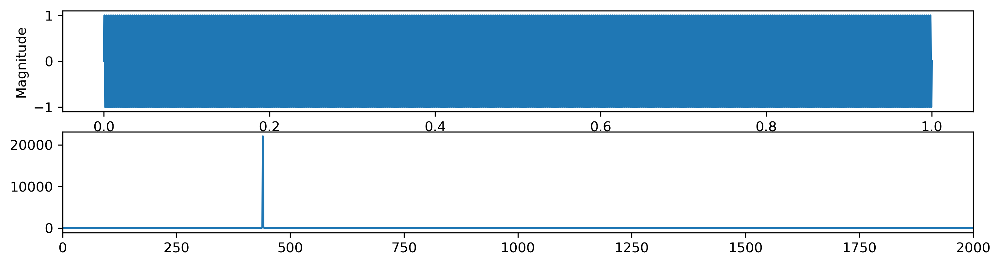

In [187]:
a.plot(True) #A tone, DFT correctly recognizes frequence

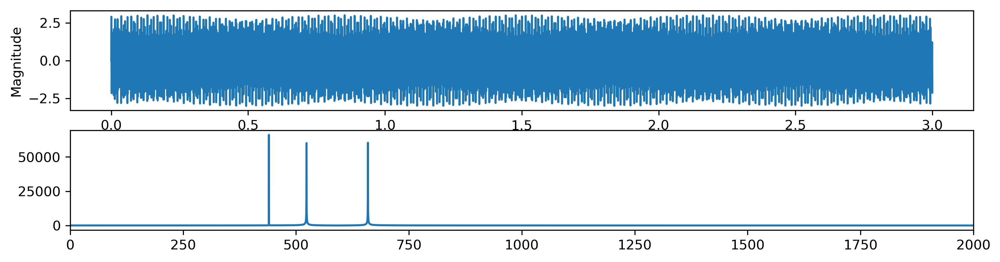

In [188]:
cord.plot(True) #Frequencies are identified through DFT

### Identify individual notes

We use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

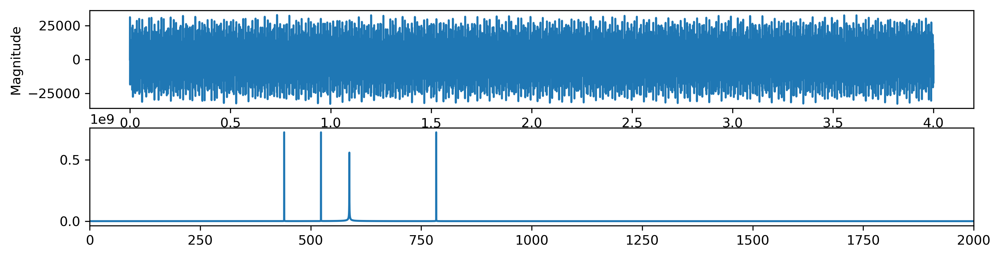

440.0 A
784.0 G
523.25 C
587.5 D


In [189]:
rate, samples = wavfile.read("mystery_chord.wav")
mystery = SoundWave(rate,samples)

IPython.display.Audio(filename = 'mystery_chord.wav')
mystery.plot(True)

# Find the Magnitudes

n = len(mystery.samples)
k_indices = np.arange(n)
freq = (mystery.rate * k_indices) / n
magnitude = np.abs(fftpack.fft(mystery.samples))

# Find the frequencies
sort = np.argsort(magnitude[:n//2])[::-1]
note_1 = freq[sort[0]]
note_2 = freq[sort[1]]
note_3 = freq[sort[2]]
note_4 = freq[sort[3]]

print(note_1, 'A')
print(note_2, 'G')
print(note_3, 'C')
print(note_4, 'D')

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Circular Convolution 
- We generate 2 seconds of white noise at the same sample rate as `tada.wav`, and then compute the circular convolution of `tada.wav` and the white noise. 

In [190]:
rate_wn = 22050        # Create 2 seconds of white noise at a given rate.
white_noise = np.random.randint(-32767, 32767, rate_wn*2, dtype=np.int16)
noise_sound = SoundWave(rate_wn, white_noise)
IPython.display.Audio(rate=noise_sound.rate, data=noise_sound.samples)


In [191]:
#convolution
convo = tada_*noise_sound
#append convolution to itself
new_convo = convo >> convo
IPython.display.Audio(rate=new_convo.rate, data=new_convo.samples)

### Linear Convolution

- We time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook.

In [192]:
rate, samples = wavfile.read("CGC.wav")
cgc_sound = SoundWave(rate,samples)

IPython.display.Audio(rate=cgc_sound.rate, data=cgc_sound.samples)

In [193]:
rate, samples = wavfile.read("GCG.wav")
gcg_sound = SoundWave(rate,samples)
IPython.display.Audio(rate=gcg_sound.rate, data=gcg_sound.samples)

In [194]:
new_tone = cgc_sound ** gcg_sound
IPython.display.Audio(rate=new_tone.rate, data=new_tone.samples)

In [195]:
scipy_tone = signal.fftconvolve(cgc_sound, gcg_sound)
IPython.display.Audio(rate=scipy_tone.rate, data=scipy_tone.samples)

In [196]:
%time cgc_sound ** gcg_sound
%time signal.fftconvolve(cgc_sound, gcg_sound)

CPU times: user 192 ms, sys: 11.9 ms, total: 204 ms
Wall time: 51.6 ms
CPU times: user 49.7 ms, sys: 910 µs, total: 50.6 ms
Wall time: 12.6 ms


### More Linear Convolution

In [197]:
rate, samples = wavfile.read("chopin.wav")
choping = SoundWave(rate,samples)
IPython.display.Audio(rate=choping.rate, data=choping.samples)

In [198]:
rate, samples = wavfile.read("balloon.wav")
balloon = SoundWave(rate,samples)
IPython.display.Audio(rate=balloon.rate, data=balloon.samples)

In [199]:
choping_balloon = choping ** balloon
IPython.display.Audio(rate=choping_balloon.rate, data=choping_balloon.samples)

### Filtering through DFT

- Implement `SoundWave.clean()`.
- We clean `noisy1.wav` and `noisy2.wav` by filtering out frequencies from $1250$-$2600$ Hz. 

In [200]:
rate, samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate,samples)
IPython.display.Audio(rate=noisy1.rate, data=noisy1.samples)

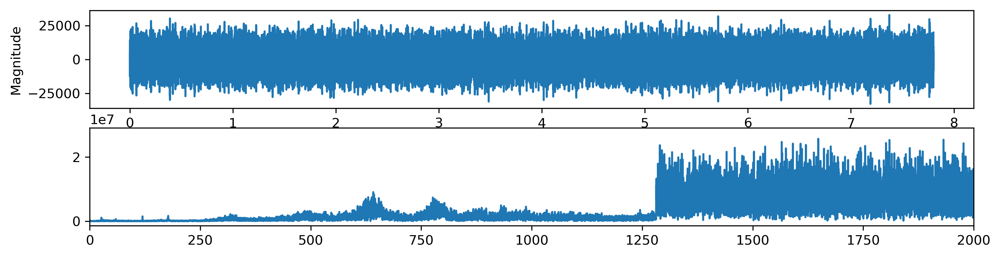

In [201]:
noisy1.plot(True)

In [202]:
noisy1.clean(1250, 2600)

IPython.display.Audio(rate=noisy1.rate, data=noisy1.samples)


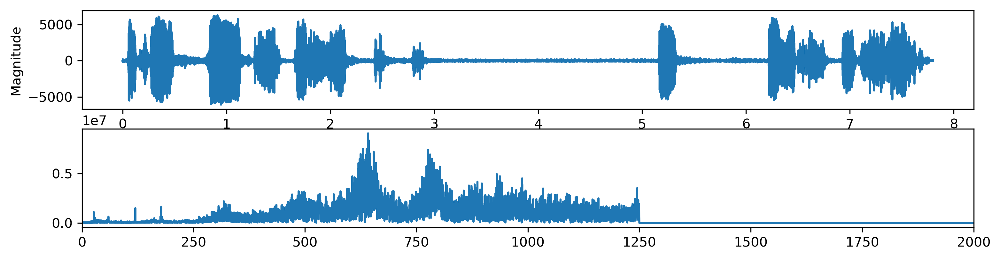

In [203]:
noisy1.plot(True)

In [204]:
rate, samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate,samples)

IPython.display.Audio(rate=noisy2.rate, data=noisy2.samples)

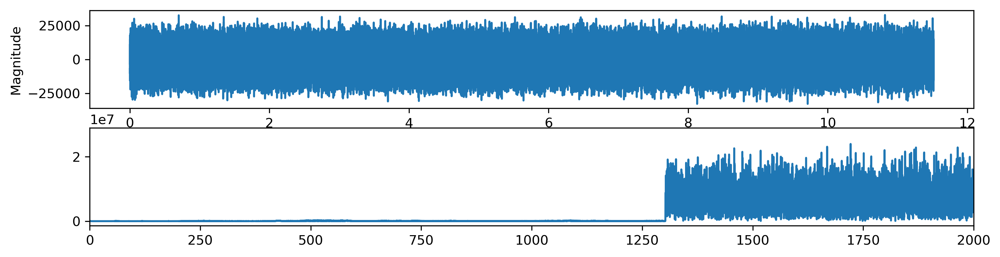

In [205]:
noisy2.plot(True)

In [206]:
noisy2.clean(1250, 4500)

IPython.display.Audio(rate=noisy2.rate, data=noisy2.samples)

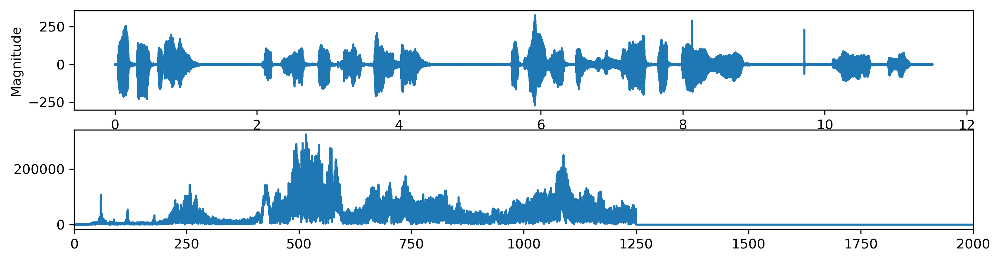

In [207]:
noisy2.plot(True)

### Filtering Sterio Audio

In [208]:
rate, samples = wavfile.read("vuvuzela.wav")
vuv1 = SoundWave(rate,samples[:,0])
IPython.display.Audio(rate=vuv1.rate, data=vuv1.samples)

In [209]:
vuv2 = SoundWave(rate,samples[:,1])
IPython.display.Audio(rate=vuv2.rate, data=vuv2.samples)

In [210]:
vuv1.clean(200,500)
IPython.display.Audio(rate=vuv1.rate, data=vuv1.samples)

In [211]:
vuv2.clean(200,500)
IPython.display.Audio(rate=vuv2.rate, data=vuv2.samples)

In [212]:
vuv = SoundWave(rate, np.vstack((vuv1.samples, vuv2.samples)))

IPython.display.Audio(rate=vuv.rate, data=vuv.samples)

### Filter image

- We clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.

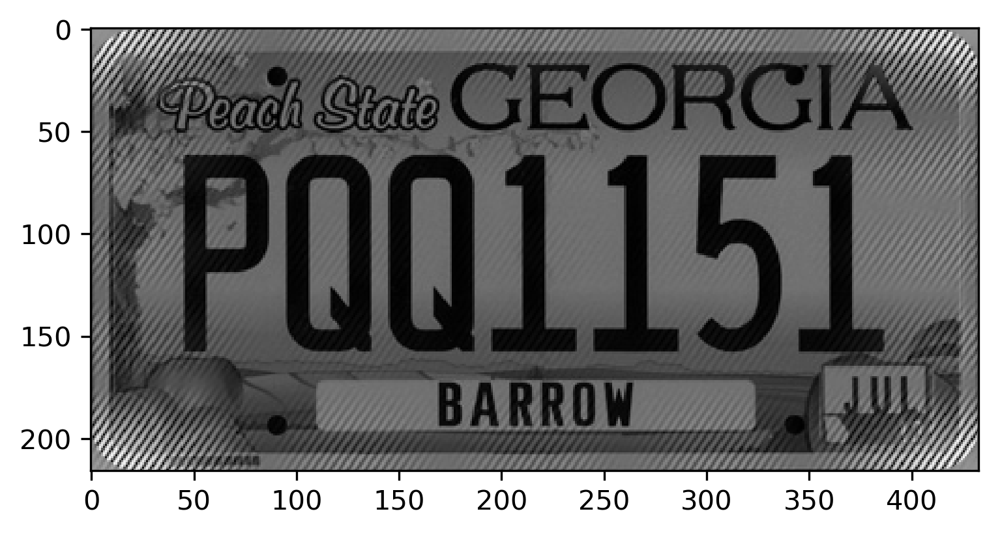

In [213]:
image = imageio.imread("license_plate.png")
plt.imshow(image, cmap = 'gray')
plt.show()

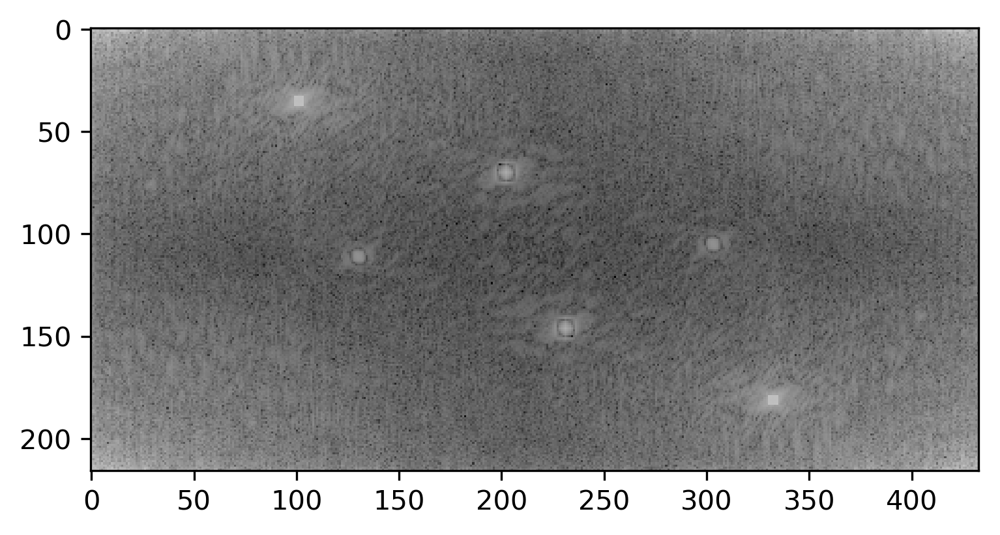

In [214]:
im_dft = fftpack.fft2(image)
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

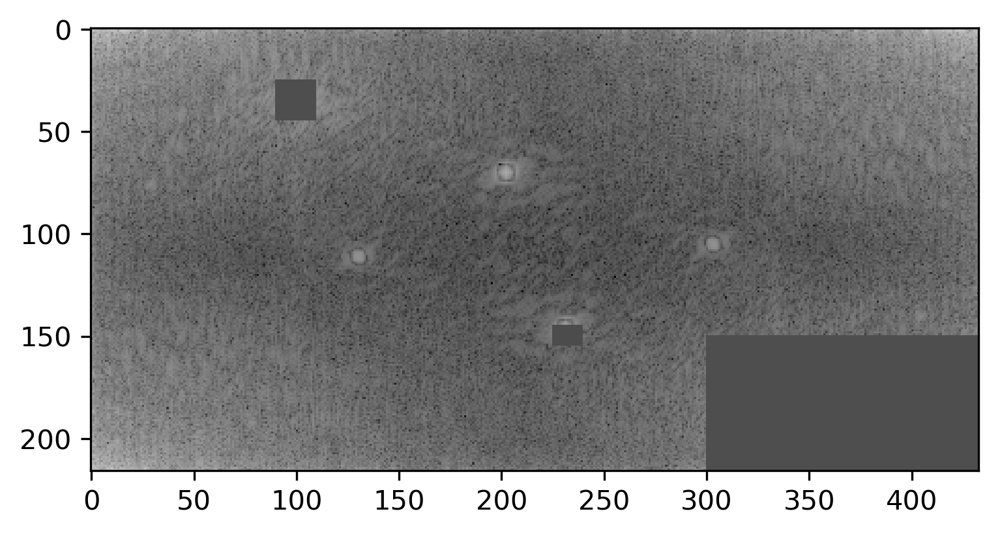

In [215]:
mean = np.mean(im_dft)
im_dft[25:45, 90:110] = 350
im_dft[178:184, 328:336] = 330
im_dft[145:155, 225:240] = 320
im_dft[150:250, 300:450] = 350

plt.imshow(np.log(np.abs(im_dft)), cmap="gray")


plt.show()


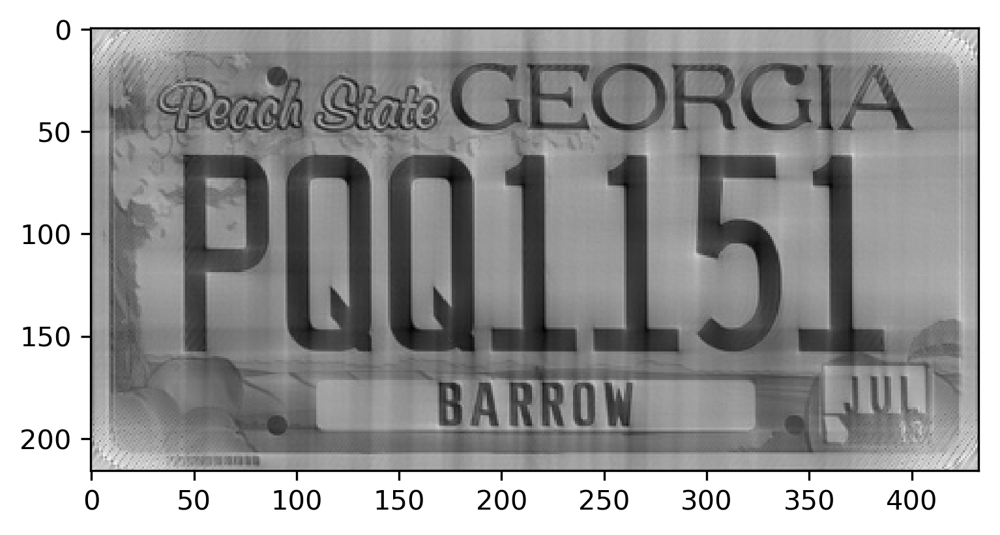

In [216]:
new_samples = fftpack.ifft2(im_dft).real
plt.imshow(new_samples, cmap = 'gray')
plt.show()